In [1]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing

#Libraries for Plotting 
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from matplotlib import ticker
import seaborn as sns
import plotly.express as px

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import nltk
from nltk.corpus import words
from nltk.tokenize import sent_tokenize
from nltk import word_tokenize
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from nltk.stem import PorterStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.sentiment.util import *

from collections import Counter
import string
import re
from collections import Counter

sns.set(style="darkgrid")

In [2]:
import sys
# !{sys.executable} -m spacy download en
import re, numpy as np, pandas as pd
from pprint import pprint

#Gensim
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.corpora import Dictionary # Create a Dictionnary for LDA
#from gensim.utils import lemmatize, simple_preprocess(This is for an older)
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.models.ldamulticore import LdaModel #Latent Dirichlet Allocation
from gensim.models import CoherenceModel # Calculate the coherence of our LDA model, which will tells us if the model is good
from gensim.models import Phrases # Trained model returning Sentences/Phrases, which are group of words generally associated
import matplotlib.pyplot as plt

# NLTK Lemmatizer
from nltk.stem import WordNetLemmatizer

# NLTK Stopwords
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

In [135]:
df = pd.read_csv(r'D:\SPRING 2023\ADVANCED DATA MINING\WEEK 8\influencers_data.csv')

C:\Users\rhoda\AppData\Local\Temp\ipykernel_25232\863802991.py:1: DtypeWarning: Columns (20) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(r'D:\SPRING 2023\ADVANCED DATA MINING\WEEK 8\influencers_data.csv')


In [4]:
df.columns

Index(['Unnamed: 0', 'name', 'headline', 'location', 'followers',
       'connections', 'about', 'Sector', 'Position', 'time_spent', 'content',
       'content_links', 'media_type', 'media_url', 'num_hashtags',
       'hashtag_followers', 'hashtags', 'reactions', 'comments', 'views',
       'votes'],
      dtype='object')

In [5]:
df['name'].unique().shape

(69,)

In [6]:
#check columns with missing values
df.isna().sum()

Unnamed: 0               0
name                     0
headline                 0
location              2272
followers               42
connections           8299
about                    0
Sector                   0
Position                 0
time_spent               1
content               2016
content_links            0
media_type            7233
media_url                0
num_hashtags             0
hashtag_followers        0
hashtags                 0
reactions                0
comments                 0
views                34012
votes                33926
dtype: int64

In [7]:
#Influencer connections
df['connections'].unique()

array(['500+', '171', nan], dtype=object)

In [8]:
#only 2 differents values for connections may not be useful, thus delete column
df = df.drop(columns = ['connections'])

In [9]:
# For location, i imagine NaN is unkown location thus I replace Nan by "Unknown"
df['Location'] = df['location'].fillna('Unknown')
df.drop(['location'],axis=1,inplace=True)

In [10]:
# There are 42 missing followers
#To reduce bias on the number of followers for a given influencer, replace NaN with the mean
followers_mean = df.followers.mean()
# Replace Nan by the mean
df["Followers"] = df['followers'].fillna(followers_mean)
df.drop(['followers'],axis=1,inplace=True)

In [11]:
# I assume Nan means no media in the post, thus replace it with "None"
df['Media_type'] = df["media_type"].fillna("None")
df.drop(['media_type'],axis=1,inplace=True)

In [12]:
#Data analysis will mainly revolve around content
#drop rows without content
df = df.loc[df['content'].notnull()]

In [13]:
# Check if there are any remaining empty rows for 'content'
empty_rows = df[df['content'].isnull()]
if empty_rows.empty:
    print("No empty rows for 'content' column.")
else:
    print("There are empty rows for 'content' column.")

No empty rows for 'content' column.


In [14]:
#Since rows have been removed, reset_index
df.reset_index(inplace=True,drop=True)

In [15]:
#And then drop columns with significantly high missing values, unnamed:0 is meaningless too
df = df.drop(columns = ['Unnamed: 0','views', 'votes'])

In [16]:
#Rename the influencer column for ease of data handling
df = df.rename(columns={'name': 'influencer'})

In [17]:
df.isna().sum()

influencer           0
headline             0
about                0
Sector               0
Position             0
time_spent           1
content              0
content_links        0
media_url            0
num_hashtags         0
hashtag_followers    0
hashtags             0
reactions            0
comments             0
Location             0
Followers            0
Media_type           0
dtype: int64

In [18]:
df.Media_type.value_counts()

article       14590
image          8614
None           5889
video          2674
document        110
poll             82
entity           31
newsletter        4
view              2
Name: Media_type, dtype: int64

In [19]:
df.columns

Index(['influencer', 'headline', 'about', 'Sector', 'Position', 'time_spent',
       'content', 'content_links', 'media_url', 'num_hashtags',
       'hashtag_followers', 'hashtags', 'reactions', 'comments', 'Location',
       'Followers', 'Media_type'],
      dtype='object')

In [20]:
df.Location.value_counts().head()

['New', 'York,', 'New', 'York,', 'United', 'States']    4125
Unknown                                                 2161
['Hungary']                                             1840
['Miami,', 'Florida,', 'United', 'States']              1777
['New', 'York', 'City', 'Metropolitan', 'Area']         1713
Name: Location, dtype: int64

In [21]:
#Top 10 influencers with highest number of followers
df.sort_values('Followers',ascending=False)['influencer'].unique()[:10]

array(['Richard Branson', 'Simon Sinek', 'Ian Bremmer', "Kevin O'Leary",
       'Mohamed El-Erian', 'Bernard Marr', 'James Altucher', 'Vani Kola',
       'Sarah Kauss', 'Carson Tate'], dtype=object)

In [23]:
num_unique_locations = df['Location'].nunique()
print("Number of unique locations:", num_unique_locations)

Number of unique locations: 44


In [ ]:
#df['Location'].value_counts().plot(kind='bar', figsize=(15, 8))

In [24]:
#plot the influencers relatively to their number of followers and reaction means
#Reactions and followers means for each authors
influencers_df = pd.pivot_table(df,index="influencer",values=["reactions","Followers"],aggfunc='mean')

C:\Users\rhoda\AppData\Local\Temp\ipykernel_25232\1639872907.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_yticklabels(['{:.0f}'.format(k) for k in current_values])
C:\Users\rhoda\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 127945 (\N{RUGBY FOOTBALL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


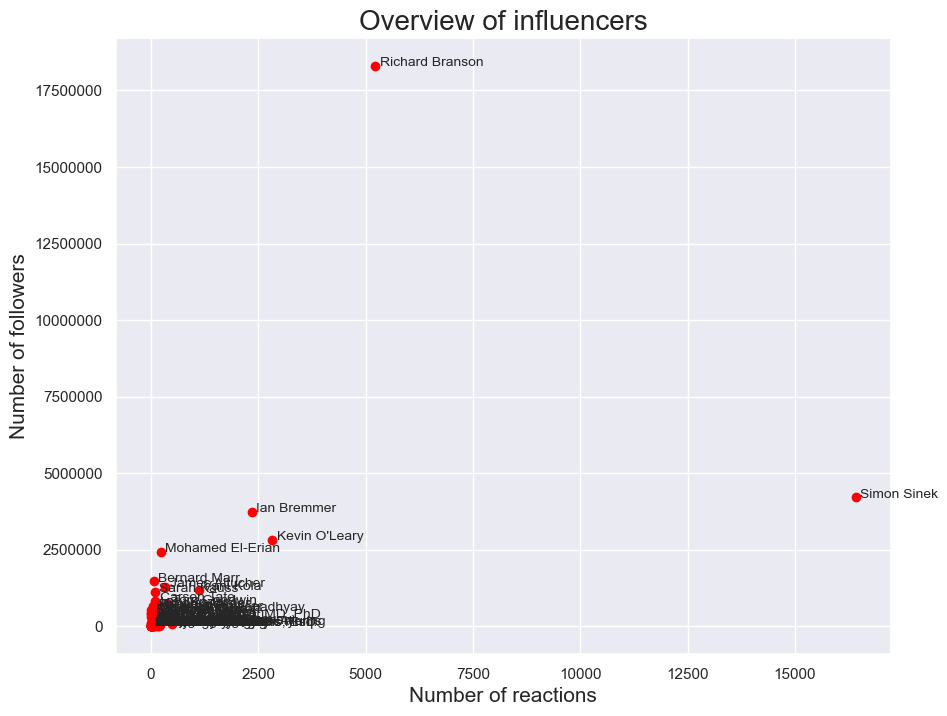

In [25]:
#Plot
plt.rcParams['figure.figsize'] = [10, 8]

for influencer in influencers_df.index:
    x = influencers_df.reactions.loc[influencer]
    y = influencers_df.Followers.loc[influencer]
    plt.scatter(x, y, color='red')
    plt.text(x+100, y+100, influencer, fontsize=10)

plt.title('Overview of influencers', fontsize=20)
plt.xlabel('Number of reactions', fontsize=15)
plt.ylabel('Number of followers', fontsize=15)

#Format yaxis to avoid scientific notation
current_values = plt.gca().get_yticks()
plt.gca().set_yticklabels(['{:.0f}'.format(k) for k in current_values])

plt.show()

Simon Sinek & Richard Branson are outliers. Simon Sinek has a lot of reactions whereas Richard Branson has a lot of followers.

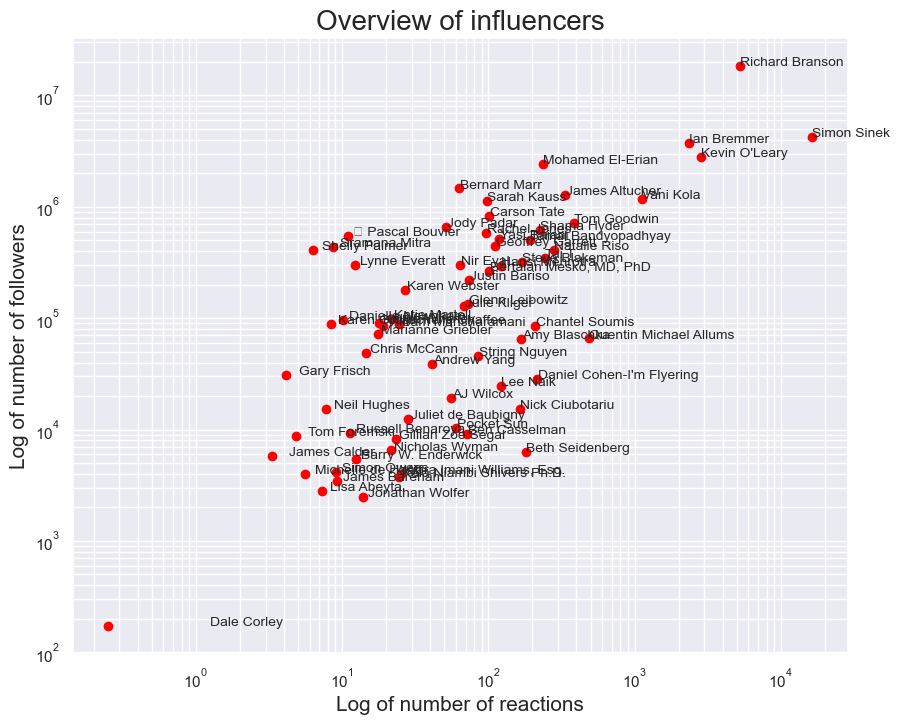

In [26]:
#visualize the entire dataset by plotting in log scale (Normalization)
#Plot
plt.rcParams['figure.figsize'] = [10, 8]

for influencer in influencers_df.index:
    x = influencers_df.reactions.loc[influencer]
    y = influencers_df.Followers.loc[influencer]
    plt.scatter(x, y,color='red')
    plt.text(x+1, y+1, influencer, fontsize=10)

plt.title('Overview of influencers', fontsize=20)
plt.xlabel('Log of number of reactions', fontsize=15)
plt.ylabel('Log of number of followers', fontsize=15)

# Set logarithmic scale on the both variables
ax=plt.gca()
ax.set_xscale("log")
ax.set_yscale("log")

#Grid
plt.grid(visible=True,which='both')

#Format yaxis to avoid scientific notation
# plt.gca().set_yticklabels('{:.0f}'.format())

plt.show()

The higher the number of followers, the higher the number of reactions

In [27]:
#Ten top hashtags by number
df.nlargest(10,['num_hashtags'],keep='all')[['influencer','hashtags','num_hashtags', 'Location']]

,influencer,hashtags,num_hashtags,Location
6944,Mohamed El-Erian,"[['#economy', 'https://www.linkedin.com/feed/h...",48,"['Cambridge,', 'England,', 'United', 'Kingdom']"
6931,Mohamed El-Erian,"[['#volatility', 'https://www.linkedin.com/fee...",47,"['Cambridge,', 'England,', 'United', 'Kingdom']"
23399,Neil Hughes,"[['#Aperio', 'https://www.linkedin.com/feed/ha...",45,"['Wilmslow,', 'England,', 'United', 'Kingdom']"
19316,Vikram Mansharamani,"[['#inequality', 'https://www.linkedin.com/fee...",44,"['Greater', 'Boston']"
23414,Neil Hughes,"[['#security', 'https://www.linkedin.com/feed/...",38,"['Wilmslow,', 'England,', 'United', 'Kingdom']"
23463,Neil Hughes,"[['#AbloyForTrust', 'https://www.linkedin.com/...",38,"['Wilmslow,', 'England,', 'United', 'Kingdom']"
6957,Mohamed El-Erian,"[['#markets', 'https://www.linkedin.com/feed/h...",37,"['Cambridge,', 'England,', 'United', 'Kingdom']"
6988,Mohamed El-Erian,"[['#economy', 'https://www.linkedin.com/feed/h...",37,"['Cambridge,', 'England,', 'United', 'Kingdom']"
6996,Mohamed El-Erian,"[['#stocks', 'https://www.linkedin.com/feed/ha...",37,"['Cambridge,', 'England,', 'United', 'Kingdom']"
7021,Mohamed El-Erian,"[['#bloomberg', 'https://www.linkedin.com/feed...",37,"['Cambridge,', 'England,', 'United', 'Kingdom']"


In [28]:
#Group each influencers reactions and comments as low, medium and high
# Calculate the quartiles of the 'reactions' column
q1_reactions = df['reactions'].quantile(0.25)
q2_reactions = df['reactions'].quantile(0.5)
q3_reactions = df['reactions'].quantile(0.75)

# Calculate the quartiles of the 'comments' column
q1_comments = df['comments'].quantile(0.25)
q2_comments = df['comments'].quantile(0.5)
q3_comments = df['comments'].quantile(0.75)

# Define a function to bin the reactions column
def classify_reaction(row):
    if row['reactions'] >= q3_reactions:
        return 'high'
    elif row['reactions'] >= q2_reactions:
        return 'medium'
    else:
        return 'low'

# Define a function to bin the comments column
def classify_comment(row):
    if row['comments'] >= q3_comments:
        return 'high'
    elif row['comments'] >= q2_comments:
        return 'medium'
    else:
        return 'low'

# Apply the binning function to the dataframe
df['reaction_class'] = df.apply(classify_reaction, axis=1)
df['comment_class'] = df.apply(classify_comment, axis=1)

In [29]:
# Remove the square brackets from the 'hashtags' column
df['hashtags'] = df['hashtags'].str.replace('\[|\]', '', regex=True)

In [30]:
# Create a new column 'hashtag_binary' and set it to 1 if a hashtag is present, 0 otherwise
df['hashtag_binary'] = df['hashtags'].apply(lambda x: 1 if len(x) > 0 else 0)
df

,influencer,headline,about,Sector,Position,time_spent,content,content_links,media_url,num_hashtags,hashtag_followers,hashtags,reactions,comments,Location,Followers,Media_type,reaction_class,comment_class,hashtag_binary
0,Nicholas Wyman,CEO IWSI Group,Nicholas Wyman for the past 25 years has shone...,Education,"Advisory, Entreprenuer, Advocacy, Author",1 day ago,Robert Lerman writes that achieving a healthy...,[['https://www.linkedin.com/in/ACoAAACy1HkBviR...,['https://www.urban.org/urban-wire/its-time-mo...,4,0,"'#workbasedlearning', 'https://www.linkedin.co...",12,1,Unknown,6484.0,article,low,low,1
1,Nicholas Wyman,CEO IWSI Group,Nicholas Wyman for the past 25 years has shone...,Education,"Advisory, Entreprenuer, Advocacy, Author",1 week ago,"National disability advocate Sara Hart Weir, ...",[['https://www.linkedin.com/in/ACoAAAHsfJgBb7_...,[],0,0,,11,0,Unknown,6484.0,None,low,low,0
2,Nicholas Wyman,CEO IWSI Group,Nicholas Wyman for the past 25 years has shone...,Education,"Advisory, Entreprenuer, Advocacy, Author",2 months ago,Exploring in this months Talent Management & H...,[['https://www.linkedin.com/in/ACoAAAADlGIBLfn...,['https://www.tlnt.com/apprenticeships-that-br...,4,0,"'#careerplanning', 'https://www.linkedin.com/f...",44,0,Unknown,6484.0,article,medium,low,1
3,Nicholas Wyman,CEO IWSI Group,Nicholas Wyman for the past 25 years has shone...,Education,"Advisory, Entreprenuer, Advocacy, Author",2 months ago,I count myself fortunate to have spent time wi...,[['https://www.linkedin.com/in/ACoAABhNxDUB9IX...,['https://gritdaily.com/the-legacy-of-verified...,3,0,"'#verifiedresumes', 'https://www.linkedin.com/...",22,2,Unknown,6484.0,article,low,low,1
4,Nicholas Wyman,CEO IWSI Group,Nicholas Wyman for the past 25 years has shone...,Education,"Advisory, Entreprenuer, Advocacy, Author",2 months ago,Online job platforms are a different way of wo...,[['https://www.linkedin.com/feed/hashtag/?keyw...,['https://www.forbes.com/sites/nicholaswyman/2...,5,0,"'#careers', 'https://www.linkedin.com/feed/has...",21,1,Unknown,6484.0,article,low,low,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31991,Simon Sinek,Optimist and Author at Simon Sinek Inc.,Simon Sinek is an unshakable optimist who beli...,Business,Author,4 years ago,Igniter of the Year 2016. Well I know that I'm...,[],['https://media-exp1.licdn.com/dms/image/C5622...,0,0,,4005,93,Unknown,4206024.0,image,high,high,0
31992,Simon Sinek,Optimist and Author at Simon Sinek Inc.,Simon Sinek is an unshakable optimist who beli...,Business,Author,4 years ago,Executives who prioritize the shareholder are ...,[],[],0,0,,1698,74,Unknown,4206024.0,video,high,high,0
31993,Simon Sinek,Optimist and Author at Simon Sinek Inc.,Simon Sinek is an unshakable optimist who beli...,Business,Author,4 years ago,"Like many, I too have been reflecting as we ne...",[],[],0,0,,661,59,Unknown,4206024.0,video,high,high,0
31994,Simon Sinek,Optimist and Author at Simon Sinek Inc.,Simon Sinek is an unshakable optimist who beli...,Business,Author,4 years ago,"If you say ""customer first"" that means your em...",[],[],0,0,,766,35,Unknown,4206024.0,video,high,high,0


In [31]:
#Check some posts ('content') to see what they look like
print(df['content'][100])
print('---------')
print(df['content'][1000])
print('---------')
print(df['content'][10000])

After decades of corporate reform in our public schools, the results are in. And it's not good news for the reformers.  On the National Assessment of Educational Progress (NAEP), which is the only assessment nationally normed and administered, this year' results showed stagnation over prior years tests, and increases in gaps between the highest-performing students and the lowest. The evidence rolls in persuasively that administering more and more assessments - diagnostic, district, state, and now nationally - in an effort to increase test scores - with the added costs and consequences of higher class sizes and fewer classes in #education #reform #gap the arts and humanities - have resulted in no improvement in reading or math scores.  It's time to stop the testing madness, and time to return to what engages our learners in our schools...it sure isn't more testing and more test preparation. 
 
 
 …see more
---------
✨ Today marks my last day at Studio71! ✨ I am so grateful for my time h

In [32]:
posts = df['content']

In [33]:
remove_url = lambda x: re.sub(r'https\S+', '', str(x))
texts_lr = posts.apply(remove_url)
texts_lr.head()

0    Robert Lerman  writes that achieving a healthy...
1    National disability advocate  Sara Hart Weir, ...
2    Exploring in this months Talent Management & H...
3    I count myself fortunate to have spent time wi...
4    Online job platforms are a different way of wo...
Name: content, dtype: object

In [34]:
lower_case = lambda x : x.lower()
lowercase_text = texts_lr.apply(lower_case)
lowercase_text.head()

0    robert lerman  writes that achieving a healthy...
1    national disability advocate  sara hart weir, ...
2    exploring in this months talent management & h...
3    i count myself fortunate to have spent time wi...
4    online job platforms are a different way of wo...
Name: content, dtype: object

In [35]:
remove_numbers = lambda x: re.sub('[\d+]','', str(x))
numbers_removed = lowercase_text.apply(remove_numbers)
numbers_removed.head()

0    robert lerman  writes that achieving a healthy...
1    national disability advocate  sara hart weir, ...
2    exploring in this months talent management & h...
3    i count myself fortunate to have spent time wi...
4    online job platforms are a different way of wo...
Name: content, dtype: object

In [36]:
remove_punctuation = lambda x : x.translate(str.maketrans('', '', string.punctuation))
punctuation_removed = numbers_removed.apply(remove_punctuation)
punctuation_removed.head()

0    robert lerman  writes that achieving a healthy...
1    national disability advocate  sara hart weir m...
2    exploring in this months talent management  hr...
3    i count myself fortunate to have spent time wi...
4    online job platforms are a different way of wo...
Name: content, dtype: object

In [37]:
remove_seemore =  lambda x: re.sub("…see more",'', str(x))
clean_posts = punctuation_removed.apply(remove_seemore)
clean_posts.head()

0    robert lerman  writes that achieving a healthy...
1    national disability advocate  sara hart weir m...
2    exploring in this months talent management  hr...
3    i count myself fortunate to have spent time wi...
4    online job platforms are a different way of wo...
Name: content, dtype: object

In [38]:
df.content = clean_posts
#df.head()

In [39]:
# Check the same posts ('content') again to verify what has happened
print(df['content'][100])
print('---------')
print(df['content'][1000])
print('---------')
print(df['content'][10000])

after decades of corporate reform in our public schools the results are in and its not good news for the reformers  on the national assessment of educational progress naep which is the only assessment nationally normed and administered this year results showed stagnation over prior years tests and increases in gaps between the highestperforming students and the lowest the evidence rolls in persuasively that administering more and more assessments  diagnostic district state and now nationally  in an effort to increase test scores  with the added costs and consequences of higher class sizes and fewer classes in education reform gap the arts and humanities  have resulted in no improvement in reading or math scores  its time to stop the testing madness and time to return to what engages our learners in our schoolsit sure isnt more testing and more test preparation 
 
 
 
---------
✨ today marks my last day at studio ✨ i am so grateful for my time here and for having a position that allowed

In [40]:
# Replace NaN values with empty string
df['about'] = df['about'].fillna('')

# Drop rows where content is empty
df.drop(df[df['about'] == ''].index, inplace=True)

# Group the about for each influencer and combine into a single document
grouped = df.groupby(['influencer'])['about'].apply(lambda x: ' '.join(x)).reset_index()

# Print the first few rows of the grouped dataframe
print(grouped.head())
#print(grouped)

           influencer                                              about
0           AJ Wilcox  𝗟𝗶𝗻𝗸𝗲𝗱𝗜𝗻 𝗔𝗱𝘀 𝗶𝘀 𝗼𝗻𝗲 𝗼𝗳 𝘁𝗵𝗲 𝗺𝗼𝘀𝘁 𝗱𝗶𝗳𝗳𝗶𝗰𝘂𝗹𝘁 𝗮𝗱 𝗰...
1        Amy Blaschka  Hey there, curious one!If you’re reading this,...
2         Andrew Yang  I moved to New York City 25 years ago. I came ...
3  Barry W. Enderwick  I’m a brand and marketing executive with a 20-...
4       Ben Casselman  Reporter covering economics and other business...


In [41]:
posts_about = df['about']

In [42]:
remove_url = lambda x: re.sub(r'https\S+', '', str(x))
about_lr = posts_about.apply(remove_url)
about_lr.head()

0    Nicholas Wyman for the past 25 years has shone...
1    Nicholas Wyman for the past 25 years has shone...
2    Nicholas Wyman for the past 25 years has shone...
3    Nicholas Wyman for the past 25 years has shone...
4    Nicholas Wyman for the past 25 years has shone...
Name: about, dtype: object

In [43]:
lower_case = lambda x : x.lower()
lowercase_about = about_lr.apply(lower_case)
lowercase_about.head()

0    nicholas wyman for the past 25 years has shone...
1    nicholas wyman for the past 25 years has shone...
2    nicholas wyman for the past 25 years has shone...
3    nicholas wyman for the past 25 years has shone...
4    nicholas wyman for the past 25 years has shone...
Name: about, dtype: object

In [44]:
remove_numbers = lambda x: re.sub('[\d+]','', str(x))
numbers_removed = lowercase_about.apply(remove_numbers)
numbers_removed.head()

0    nicholas wyman for the past  years has shone a...
1    nicholas wyman for the past  years has shone a...
2    nicholas wyman for the past  years has shone a...
3    nicholas wyman for the past  years has shone a...
4    nicholas wyman for the past  years has shone a...
Name: about, dtype: object

In [45]:
remove_punctuation = lambda x : x.translate(str.maketrans('', '', string.punctuation))
punctuation_about = numbers_removed.apply(remove_punctuation)
punctuation_about.head()

0    nicholas wyman for the past  years has shone a...
1    nicholas wyman for the past  years has shone a...
2    nicholas wyman for the past  years has shone a...
3    nicholas wyman for the past  years has shone a...
4    nicholas wyman for the past  years has shone a...
Name: about, dtype: object

In [46]:
remove_seemore =  lambda x: re.sub("…see more",'', str(x))
clean_about = punctuation_about.apply(remove_seemore)
clean_about.head()

0    nicholas wyman for the past  years has shone a...
1    nicholas wyman for the past  years has shone a...
2    nicholas wyman for the past  years has shone a...
3    nicholas wyman for the past  years has shone a...
4    nicholas wyman for the past  years has shone a...
Name: about, dtype: object

In [47]:
df.about = clean_about

In [48]:
# define a function to count the number of words in a string
def count_words(text):
    words = text.split()
    return len(words)


In [49]:
#count the number of words in each row in the content column
df['word_count'] = df['content'].apply(lambda x: len(str(x).split()))

In [50]:
df.word_count

0         61
1         14
2         69
3        109
4         45
        ... 
31991    156
31992     26
31993    111
31994     18
31995     23
Name: word_count, Length: 31996, dtype: int64

# Preprocess Text in content Column

In [51]:
lemma = WordNetLemmatizer()
stop_words = stopwords.words('english')

In [52]:
def text_prep(x):
     corp = str(x).lower() 
     corp = re.sub('[^a-zA-Z]+',' ', corp).strip() 
     tokens = word_tokenize(corp)
     words = [t for t in tokens if t not in stop_words]
     lemmatize = [lemma.lemmatize(w) for w in words]
    
     return lemmatize

In [53]:
preprocess_tag = [text_prep(i) for i in df['content']]
df["preprocess_txt"] = preprocess_tag

In [54]:
df.preprocess_txt

0        [robert, lerman, writes, achieving, healthy, f...
1        [national, disability, advocate, sara, hart, w...
2        [exploring, month, talent, management, hr, com...
3        [count, fortunate, spent, time, brooklynborn, ...
4        [online, job, platform, different, way, workin...
                               ...                        
31991    [igniter, year, well, know, im, optimist, im, ...
31992    [executive, prioritize, shareholder, like, coa...
31993    [like, many, reflecting, near, end, year, mark...
31994    [say, customer, first, mean, employee, come, l...
31995    [small, work, hard, serve, big, way, big, work...
Name: preprocess_txt, Length: 31996, dtype: object

In [ ]:
print(type(df.preprocess_txt))

In [55]:
df['clean_content'] = df['preprocess_txt'].map(lambda x: len(x))

In [56]:
df.clean_content

0        39
1        12
2        45
3        72
4        28
         ..
31991    82
31992    13
31993    49
31994    12
31995    13
Name: clean_content, Length: 31996, dtype: int64

In [57]:
#Group each influencers high, medium and low comments

# Binning function to assign 'high', 'medium', or 'low' labels to each comment
def bin_reactions(x):
    if x >= df['comments'].quantile(0.75):
        return 'high'
    elif x >= df['comments'].quantile(0.25):
        return 'medium'
    else:
        return 'low'

In [58]:
# Apply the binning function to the 'reactions' column
df['comments_label'] = df['comments'].apply(bin_reactions)

# Group the reaction labels by influencer
grouped = df.groupby(['influencer', 'comments_label']).size().reset_index(name='count')

# Pivot the grouped dataframe to reshape it into a wide format
pivoted = grouped.pivot(index='influencer', columns='comments_label', values='count').fillna(0)

# Reset the index of the pivoted dataframe
pivoted = pivoted.reset_index()

# Print the first few rows of the pivoted dataframe
print(pivoted.head(10))

comments_label               influencer   high  medium
0                             AJ Wilcox  134.0   312.0
1                          Amy Blaschka  511.0    28.0
2                           Andrew Yang   10.0   237.0
3                    Barry W. Enderwick    9.0   452.0
4                         Ben Casselman   18.0    29.0
5                          Bernard Marr    9.0    51.0
6               Bertalan Meskó, MD, PhD  345.0  1495.0
7                       Beth Seidenberg    7.0     8.0
8                           Carson Tate   56.0  1208.0
9                        Chantel Soumis  321.0    89.0


In [59]:
#Group each influencers high, medium and low reaction

# Binning function to assign 'high', 'medium', or 'low' labels to each reaction
def bin_reactions(x):
    if x >= df['reactions'].quantile(0.75):
        return 'high'
    elif x >= df['reactions'].quantile(0.25):
        return 'medium'
    else:
        return 'low'

In [60]:
# Apply the binning function to the 'reactions' column
df['reaction_label'] = df['reactions'].apply(bin_reactions)

# Group the reaction labels by influencer
grouped = df.groupby(['influencer', 'reaction_label']).size().reset_index(name='count')

# Pivot the grouped dataframe to reshape it into a wide format
pivoted = grouped.pivot(index='influencer', columns='reaction_label', values='count').fillna(0)

# Reset the index of the pivoted dataframe
pivoted = pivoted.reset_index()

# Print the first few rows of the pivoted dataframe
print(pivoted.head(69))

#print(pivoted)

reaction_label           influencer   high    low  medium
0                         AJ Wilcox   31.0   43.0   372.0
1                      Amy Blaschka  261.0    6.0   272.0
2                       Andrew Yang    8.0   23.0   216.0
3                Barry W. Enderwick    3.0  212.0   246.0
4                     Ben Casselman    4.0    6.0    37.0
..                              ...    ...    ...     ...
63                      Tom Goodwin  797.0    1.0   440.0
64                        Vani Kola  828.0    1.0    69.0
65              Vikram Mansharamani    4.0   71.0   104.0
66                      Yasi Baiani   85.0    2.0   268.0
67                 🏉 Pascal Bouvier    6.0  689.0   583.0

[68 rows x 4 columns]


In [61]:
# Calculate the quartiles of the 'reactions' column
q1 = df['reactions'].quantile(0.25)
q2 = df['reactions'].quantile(0.5)
q3 = df['reactions'].quantile(0.75)

# Define a function to bin the reactions column
def classify_reaction(row):
    if row['reactions'] >= q3:
        return 'high'
    elif row['reactions'] >= q2:
        return 'medium'
    else:
        return 'low'

# Apply the binning function to the dataframe
df['reaction_class'] = df.apply(classify_reaction, axis=1)

# Calculate the quartiles of the 'comments' column
q1 = df['comments'].quantile(0.25)
q2 = df['comments'].quantile(0.5)
q3 = df['comments'].quantile(0.75)

# Define a function to bin the comments column
def classify_comment(row):
    if row['comments'] >= q3:
        return 'high'
    elif row['comments'] >= q2:
        return 'medium'
    else:
        return 'low'

# Apply the binning function to the dataframe
df['comment_class'] = df.apply(classify_comment, axis=1)

# Group the data by influencer and reaction and comment classes
grouped = df.groupby(['influencer', 'reaction_class', 'comment_class']).size().reset_index(name='count')

# Print the first few rows of the grouped dataframe
print(grouped.head())

  influencer reaction_class comment_class  count
0  AJ Wilcox           high          high     31
1  AJ Wilcox            low          high     10
2  AJ Wilcox            low           low    115
3  AJ Wilcox            low        medium     84
4  AJ Wilcox         medium          high     93


In [62]:
# Group the reaction labels by influencer
grouped = df.groupby(['influencer', 'comments_label']).size().reset_index(name='count')

# Pivot the grouped dataframe to reshape it into a wide format
pivoted = grouped.pivot(index='influencer', columns='comments_label', values='count').fillna(0)

# Reset the index of the pivoted dataframe
pivoted = pivoted.reset_index()

# Sort the pivoted dataframe by the total count of comments in descending order
pivoted_sorted = pivoted.sort_values('high', ascending=False)

# Print the influencers with the highest comments in decreasing order
#print(pivoted_sorted[['influencer', 'high']])
print(pivoted_sorted[['influencer', 'high']].head(10))

comments_label               influencer    high
63                          Tom Goodwin  1052.0
50                      Richard Branson   948.0
41                     Mohamed El-Erian   597.0
64                            Vani Kola   597.0
20                       James Altucher   567.0
1                          Amy Blaschka   511.0
33                        Kevin O'Leary   388.0
48               Quentin Michael Allums   362.0
19                          Ian Bremmer   359.0
6               Bertalan Meskó, MD, PhD   345.0


In [63]:
# Group the reaction labels by influencer
grouped = df.groupby(['influencer', 'reaction_label']).size().reset_index(name='count')

# Pivot the grouped dataframe to reshape it into a wide format
pivoted = grouped.pivot(index='influencer', columns='reaction_label', values='count').fillna(0)

# Reset the index of the pivoted dataframe
pivoted = pivoted.reset_index()

# Sort the pivoted dataframe by the total count of comments in descending order
pivoted_sorted = pivoted.sort_values('high', ascending=False)

# Print the influencers with the highest comments in decreasing order
#print(pivoted_sorted[['influencer', 'high']])
print(pivoted_sorted[['influencer', 'high']].head(10))

reaction_label               influencer   high
50                      Richard Branson  962.0
64                            Vani Kola  828.0
63                          Tom Goodwin  797.0
41                     Mohamed El-Erian  703.0
20                       James Altucher  677.0
33                        Kevin O'Leary  405.0
6               Bertalan Meskó, MD, PhD  350.0
48               Quentin Michael Allums  330.0
19                          Ian Bremmer  322.0
8                           Carson Tate  264.0


In [64]:
#Group each influencers high, medium and low reaction

# Binning function to assign 'high', 'medium', or 'low' labels to each reaction
def bin_reactions(x):
    if x >= df['reactions'].quantile(0.75):
        return 'high'
    elif x >= df['reactions'].quantile(0.25):
        return 'medium'
    else:
        return 'low'

# Apply the binning function to the 'reactions' column
df['reaction_label'] = df['reactions'].apply(bin_reactions)

# Group the reaction labels by influencer
grouped = df.groupby(['influencer', 'reaction_label']).size().reset_index(name='count')

# Pivot the grouped dataframe to reshape it into a wide format
pivoted = grouped.pivot(index='influencer', columns='reaction_label', values='count').fillna(0)

# Reset the index of the pivoted dataframe
pivoted = pivoted.reset_index()

# Print the first few rows of the pivoted dataframe
print(pivoted.head(10))

#print(pivoted)

reaction_label               influencer   high    low  medium
0                             AJ Wilcox   31.0   43.0   372.0
1                          Amy Blaschka  261.0    6.0   272.0
2                           Andrew Yang    8.0   23.0   216.0
3                    Barry W. Enderwick    3.0  212.0   246.0
4                         Ben Casselman    4.0    6.0    37.0
5                          Bernard Marr    6.0    1.0    53.0
6               Bertalan Meskó, MD, PhD  350.0   23.0  1467.0
7                       Beth Seidenberg    7.0    0.0     8.0
8                           Carson Tate  264.0   32.0   968.0
9                        Chantel Soumis  198.0    7.0   205.0


In [65]:
# Convert lists in the preprocess_txt column to strings
df['preprocess_txt'] = df['preprocess_txt'].apply(lambda x: ' '.join(x))

# Group the content by influencer and combine into a single document
grouped = df.groupby(['influencer'])['preprocess_txt'].apply(lambda x: ' '.join(x)).reset_index()

# Print the first few rows of the grouped dataframe
print(grouped.head())

           influencer                                     preprocess_txt
0           AJ Wilcox  excited part webinar check thing linkedin adve...
1        Amy Blaschka  news flash preventing career progress external...
2         Andrew Yang  q fundraising number thank campaign come far c...
3  Barry W. Enderwick  got live well defined clearly articulated cult...
4       Ben Casselman  economic recovery faltering check today brutal...


In [66]:
# Download English stop words
nltk.download('stopwords')
nltk.download('vader_lexicon')

# Create a set of English stop words
stop_words = set(stopwords.words('english'))
# Add custom stop words
#custom_stopwords = ['dont', 'linkedin', 'don’t','get', 'it’s', 'company', 'like', 'want', 'need','pm', '��', 'much', 'good', 'see','also', 'one', 'th', 'things', 'going', 'im', 'e'
#stop_words = set(stopwords.words('english') + custom_stopwords)

# Create a dictionary of text for each influencer
text_dict = {}
for influencer in grouped['influencer'].unique():
    text_dict[influencer] = ' '.join(grouped[grouped['influencer']==influencer]['preprocess_txt'].astype(str).tolist())

# Loop through each influencer's text and print the top 15 most common words
for influencer, text in text_dict.items():
    # Tokenize the text into individual words
    words = text.split()

    # Remove English stop words
    words = [word for word in words if word.lower() not in stop_words]

    # Count the frequency of each word
    word_freq = Counter(words)

    # Print the top 15 most common words
    print(f"{influencer}:\n{word_freq.most_common(15)}\n")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rhoda\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\rhoda\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


AJ Wilcox:
[('linkedin', 236), ('linkedinads', 133), ('ad', 121), ('get', 104), ('check', 85), ('marketing', 78), ('im', 76), ('thanks', 76), ('podcast', 72), ('youre', 67), ('one', 65), ('know', 61), ('social', 58), ('free', 56), ('want', 50)]

Amy Blaschka:
[('career', 522), ('leadership', 436), ('others', 228), ('way', 219), ('share', 212), ('help', 201), ('time', 191), ('people', 181), ('thing', 173), ('one', 170), ('communication', 164), ('make', 161), ('leader', 157), ('video', 155), ('latest', 153)]

Andrew Yang:
[('people', 57), ('would', 47), ('need', 44), ('job', 41), ('new', 36), ('american', 34), ('u', 29), ('million', 29), ('income', 28), ('basic', 26), ('one', 26), ('economy', 25), ('work', 25), ('time', 25), ('many', 22)]

Barry W. Enderwick:
[('brand', 270), ('netflix', 245), ('company', 154), ('marketing', 148), ('like', 123), ('one', 88), ('amazon', 85), ('think', 73), ('great', 72), ('people', 71), ('see', 65), ('business', 63), ('streaming', 59), ('get', 57), ('read

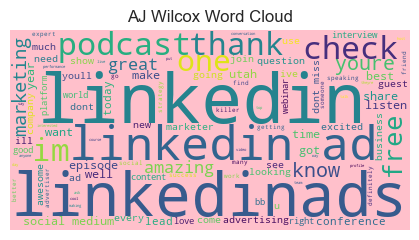

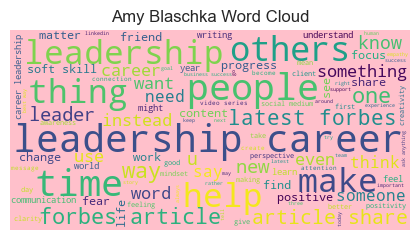

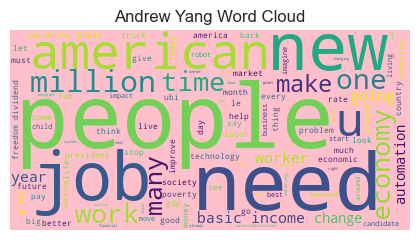

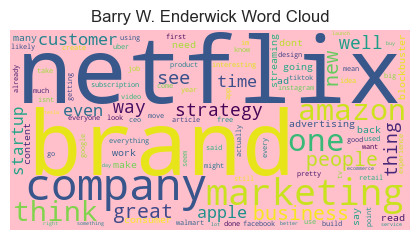

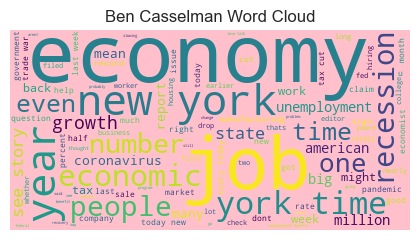

...

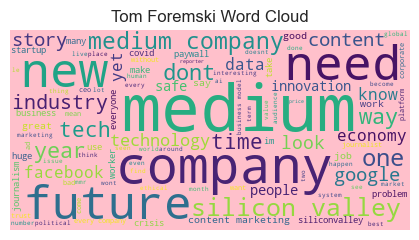

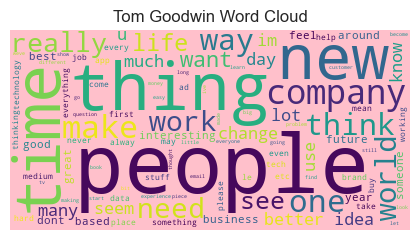

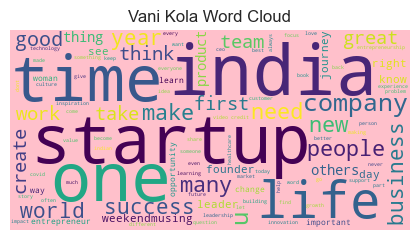

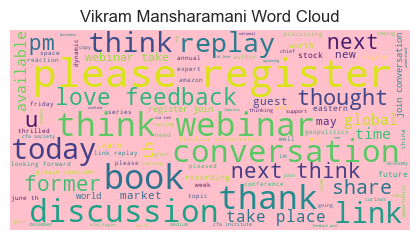

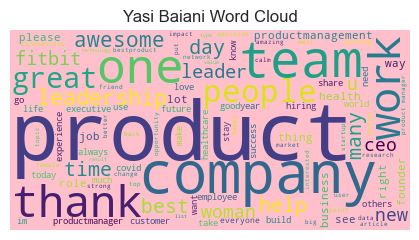

C:\Users\rhoda\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 127945 (\N{RUGBY FOOTBALL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


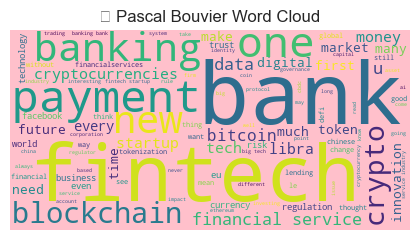

In [67]:
# Create a dictionary of text for each influencer
text_dict = {}
for influencer in grouped['influencer'].unique():
    text_dict[influencer] = ' '.join(grouped[grouped['influencer']==influencer]['preprocess_txt'].astype(str).tolist())

# Generate a word cloud for each influencer
for influencer, text in text_dict.items():
    # Create a word cloud object
    wordcloud = WordCloud(background_color="pink", max_words=100, contour_width=3, contour_color='steelblue')

    # Generate the word cloud
    wordcloud.generate(text)

    # Plot the word cloud
    plt.figure(figsize=(4, 3), facecolor=None)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.title(influencer + ' Word Cloud')
    plt.show()


In [68]:
lemma = WordNetLemmatizer()
stop_words = stopwords.words('english')

In [69]:
def text_prep(x):
     corp = str(x).lower() 
     corp = re.sub('[^a-zA-Z]+',' ', corp).strip() 
     tokens = word_tokenize(corp)
     words = [t for t in tokens if t not in stop_words]
     lemmatize = [lemma.lemmatize(w) for w in words]
    
     return lemmatize

In [70]:
clean_about_tag = [text_prep(i) for i in df['about']]
df["clean_about_txt"] = clean_about_tag

In [71]:
df.clean_about_txt

0        [nicholas, wyman, past, year, shone, light, mi...
1        [nicholas, wyman, past, year, shone, light, mi...
2        [nicholas, wyman, past, year, shone, light, mi...
3        [nicholas, wyman, past, year, shone, light, mi...
4        [nicholas, wyman, past, year, shone, light, mi...
                               ...                        
31991    [simon, sinek, unshakable, optimist, belief, b...
31992    [simon, sinek, unshakable, optimist, belief, b...
31993    [simon, sinek, unshakable, optimist, belief, b...
31994    [simon, sinek, unshakable, optimist, belief, b...
31995    [simon, sinek, unshakable, optimist, belief, b...
Name: clean_about_txt, Length: 31996, dtype: object

In [72]:
# Convert lists in the preprocess_txt column to strings
df['clean_about_txt'] = df['clean_about_txt'].apply(lambda x: ' '.join(x))

# Group the content by influencer and combine into a single document
grouped = df.groupby(['influencer'])['clean_about_txt'].apply(lambda x: ' '.join(x)).reset_index()

# Print the first few rows of the grouped dataframe
print(grouped.head())

           influencer                                    clean_about_txt
0           AJ Wilcox  click expensive mistake becomes expensive one ...
1        Amy Blaschka  hey curious oneif reading may wondering social...
2         Andrew Yang  moved new york city year ago came age fell lov...
3  Barry W. Enderwick  brand marketing executive year track record su...
4       Ben Casselman  reporter covering economics business topic new...


In [73]:
# Download English stop words
nltk.download('stopwords')
nltk.download('vader_lexicon')

# Create a set of English stop words
stop_words = set(stopwords.words('english'))
# Add custom stop words
custom_stopwords = ['get', 'New', 'York', 'ago.', 'City', 'here.', 'esq', 'additional', 'demonstrated', 'specialist', 'history', 'say', 'want', 'inc', 'know', 'olearys', 'sb', 'u', 'bb' 'use', 'williams', 'lisa', 'imani', 'expensive', 'around', 'garrett', 'working', 'would', 'extremely', 'bernard', 'including', 'became', 'unknown', 'father', 'came', 'moved', 'late', 'london', 'mbym', 'also', 'let', 'make', 'dont', 'based', 'named', 'one', 'came', 'Kiara', 'I’d', '|', 'way', 'find' 'one', 'Kola', 'like', 'would','Sarah', 'way', 'Vani', "I've",'Sramana', 'Tai', 'Sinek', '-', '--', 'Palmer', 'I’m', 'Juliet', 'Simon', 'Nir', 'gone', '&','Eyal','Nicholas', 'Wyman', 'years', 'past', 'also', "O'Leary's", "Michelle's", "I'm", 'almost' 'PhD', 'Michelle', 'actually', 'Lisa', 'Lee', 'Imani', 'Kevin', 'Williams,' 'Jody', 'Zoe', 'Ian', 'including', 'James', 'Segal', 'Gillian', 'York', 'New', 'years', 'New', 'Beth', 'you’re', '300%', 'demonstrated', 'also', 'per' 'Bernard','Marr', 'Dr.', ]
stop_words = set(stopwords.words('english') + custom_stopwords)


# Create a dictionary of text for each influencer
text_dict = {}
for influencer in grouped['influencer'].unique():
    text_dict[influencer] = ' '.join(grouped[grouped['influencer']==influencer]['clean_about_txt'].astype(str).tolist())

# Loop through each influencer's text and print the top 15 most common words
for influencer, text in text_dict.items():
    # Tokenize the text into individual words
    words = text.split()

    # Remove English stop words
    words = [word for word in words if word.lower() not in stop_words]

    # Count the frequency of each word
    word_freq = Counter(words)

    # Print the top 15 most common words
    print(f"{influencer}:\n{word_freq.most_common(20)}\n")

AJ Wilcox:
[('linkedin', 3568), ('ad', 2676), ('marketing', 2230), ('account', 1338), ('agency', 892), ('effort', 892), ('recruiting', 892), ('social', 892), ('medium', 892), ('podcast', 892), ('looking', 892), ('click', 446), ('mistake', 446), ('becomes', 446), ('people', 446), ('miss', 446), ('channel', 446), ('close', 446), ('largest', 446), ('dealswere', 446)]

Amy Blaschka:
[('social', 2156), ('story', 2156), ('personal', 2156), ('client', 2156), ('medium', 1617), ('thought', 1617), ('post', 1617), ('leadership', 1617), ('capture', 1617), ('ghostwriter', 1078), ('help', 1078), ('communicate', 1078), ('connect', 1078), ('branding', 1078), ('wisdom', 1078), ('others', 1078), ('partner', 1078), ('listen', 1078), ('take', 1078), ('together', 1078)]

Andrew Yang:
[('city', 988), ('new', 494), ('york', 494), ('year', 247), ('ago', 247), ('age', 247), ('fell', 247), ('love', 247), ('seeing', 247), ('break', 247), ('heart', 247), ('coming', 247), ('month', 247), ('determine', 247), ('traj

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rhoda\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\rhoda\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Carson Tate:
[('world', 7584), ('year', 6320), ('work', 6320), ('workforce', 5056), ('employee', 5056), ('burnout', 5056), ('team', 5056), ('per', 5056), ('engagement', 3792), ('empower', 3792), ('meeting', 3792), ('changed', 2528), ('last', 2528), ('business', 2528), ('easily', 2528), ('goal', 2528), ('profitability', 2528), ('worker', 2528), ('hybrid', 2528), ('model', 2528)]

Chantel Soumis:
[('brand', 2050), ('creative', 1230), ('personal', 1230), ('client', 1230), ('include', 1230), ('linkedin', 1230), ('social', 1230), ('mother', 820), ('little', 820), ('homemade', 820), ('marketing', 820), ('awareness', 820), ('lead', 820), ('generation', 820), ('development', 820), ('opportunity', 820), ('many', 820), ('obstacle', 820), ('help', 820), ('increase', 820)]

Chris McCann:
[('stage', 244), ('early', 122), ('love', 122), ('capital', 122), ('seed', 122), ('first', 122), ('infrastructure', 122), ('system', 122), ('building', 61), ('company', 61), ('meet', 61), ('criterion', 61), ('conn

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rhoda\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\rhoda\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


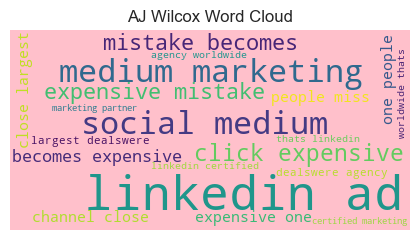

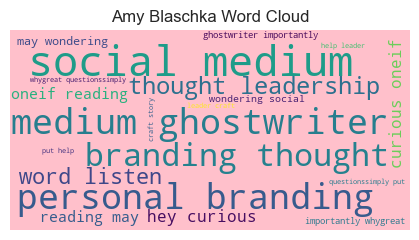

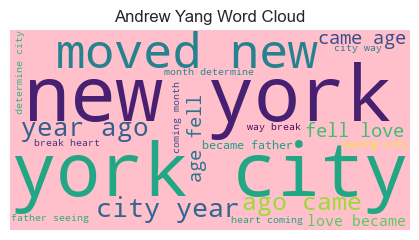

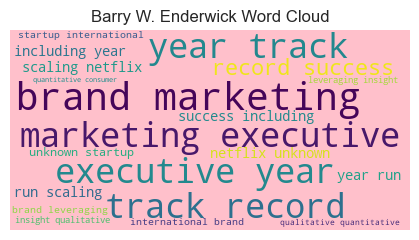

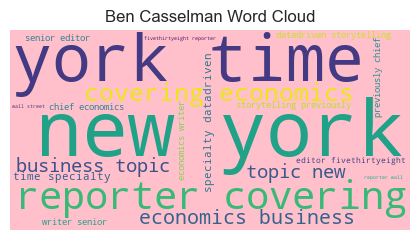

...

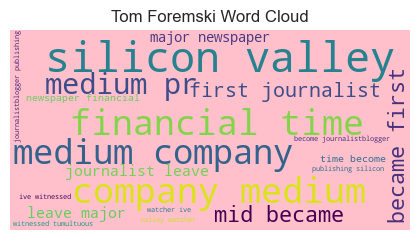

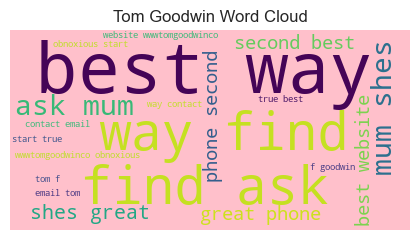

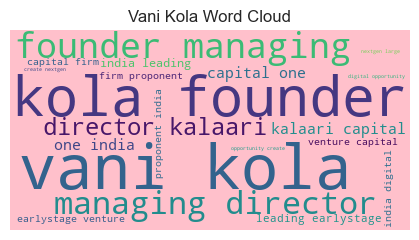

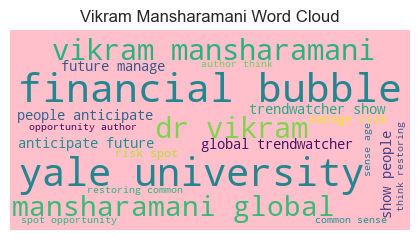

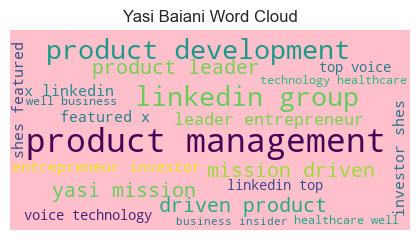

C:\Users\rhoda\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 127945 (\N{RUGBY FOOTBALL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


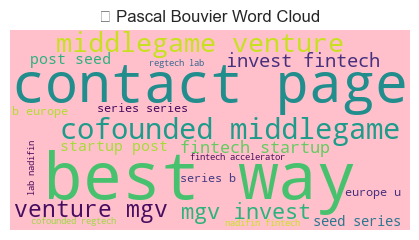

In [74]:
from wordcloud import WordCloud

nltk.download('stopwords')
nltk.download('vader_lexicon')

# Create a set of English stop words
stop_words = set(stopwords.words('english'))
# Add custom stop words
custom_stopwords = ['get', 'New', 'York', 'ago.', 'City', 'here.', 'esq', 'additional', 'demonstrated', 'specialist', 'history', 'say', 'want', 'inc', 'know', 'olearys', 'sb', 'u', 'bb' 'use', 'williams', 'lisa', 'imani', 'expensive', 'around', 'garrett', 'working', 'would', 'extremely', 'bernard', 'including', 'became', 'unknown', 'father', 'came', 'moved', 'late', 'london', 'mbym', 'also', 'let', 'make', 'dont', 'based', 'named', 'one', 'came', 'Kiara', 'I’d', '|', 'way', 'find' 'one', 'Kola', 'like', 'would','Sarah', 'way', 'Vani', "I've",'Sramana', 'Tai', 'Sinek', '-', '--', 'Palmer', 'I’m', 'Juliet', 'Simon', 'Nir', 'gone', '&','Eyal','Nicholas', 'Wyman', 'years', 'past', 'also', "O'Leary's", "Michelle's", "I'm", 'almost' 'PhD', 'Michelle', 'actually', 'Lisa', 'Lee', 'Imani', 'Kevin', 'Williams,' 'Jody', 'Zoe', 'Ian', 'including', 'James', 'Segal', 'Gillian', 'York', 'New', 'years', 'New', 'Beth', 'you’re', '300%', 'demonstrated', 'also', 'per' 'Bernard','Marr', 'Dr.', ]
stop_words = set(stopwords.words('english') + custom_stopwords)

# Create a dictionary of text for each influencer
text_dict = {}
for influencer in grouped['influencer'].unique():
    text_dict[influencer] = ' '.join(grouped[grouped['influencer']==influencer]['clean_about_txt'].astype(str).tolist())

# Generate a word cloud for each influencer
for influencer, text in text_dict.items():
    # Create a word cloud object
    wordcloud = WordCloud(background_color="pink", max_words=20, contour_width=3, contour_color='steelblue')

    # Generate the word cloud
    wordcloud.generate(text)

    # Plot the word cloud
    plt.figure(figsize=(4, 3), facecolor=None)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.title(influencer + ' Word Cloud')
    plt.show()

# Find Ideal Number(k) of Clusters Using the Elbow Method

In [ ]:
#import matplotlib.pyplot as plt
#from sklearn.cluster import KMeans
#Sum_of_squared_distances = []
#K = range(1,31)
#for k in K:
   ##km = km.fit(X_tfidf)
   #Sum_of_squared_distances.append(km.inertia_)
#plt.plot(K, Sum_of_squared_distances, 'bx-')
#plt.xlabel('k')
#plt.ylabel('Sum_of_squared_distances')
#plt.title('Elbow Method For Optimal k')
#plt.show()

# Labelling content with reaction_class

In [75]:
categories = [
    "low",
    "medium",
    "high",
]

labels = df.reaction_class
unique_labels, category_sizes = np.unique(labels, return_counts=True)
true_k = unique_labels.shape[0]

print(f"{len(df.preprocess_txt)} documents - {true_k} categories")

31996 documents - 3 categories


In [76]:
# Display the size of each class
for i, category in enumerate(categories):
    print(f"{category}: {category_sizes[i]} contents")

low: 8012 contents
medium: 15901 contents
high: 8083 contents


In [77]:
# Map each content to its corresponding reaction_class
for index, row in df.iterrows():
    content = row['content']
    reaction_class = row['reaction_class']
    print(f"Content: {content}\tReaction Class: {reaction_class}")

Content: robert lerman  writes that achieving a healthy future of work requires employees to build skills that help them attain productive and rewarding careers he notes  one of the most costeffective ways to do this is through apprenticeship which helps workers master occupations and gain professional identity and pride coudlnt agree more  workbasedlearning   usa   apprenticeship   read the article on  urbanwire   urban institute 
 
 
 	Reaction Class: low
Content: national disability advocate  sara hart weir ms   shares how congress passed the able act	Reaction Class: low
Content: exploring in this months talent management  hr what a company should consider to get the most out of a modern apprenticeship program thanks to employer  entrepreneuer  ankur gopal  for sharing insights on your it program  why not start a program in  wishing you all a safe and happy festive season  nick  careerplanning   apprenticeships   workbasedlearning   careers   urban institute   zach boren   robert le

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Defining the Quality of Clustering Results¶

In [79]:
from collections import defaultdict
from sklearn import metrics
from time import time

evaluations = []
evaluations_std = []


def fit_and_evaluate(km, X, name=None, n_runs=5):
    name = km.__class__.__name__ if name is None else name

    train_times = []
    scores = defaultdict(list)
    for seed in range(n_runs):
        km.set_params(random_state=seed)
        t0 = time()
        km.fit(X)
        train_times.append(time() - t0)
        scores["Homogeneity"].append(metrics.homogeneity_score(labels, km.labels_))
        scores["Completeness"].append(metrics.completeness_score(labels, km.labels_))
        scores["V-measure"].append(metrics.v_measure_score(labels, km.labels_))
        scores["Adjusted Rand-Index"].append(
            metrics.adjusted_rand_score(labels, km.labels_)
        )
        scores["Silhouette Coefficient"].append(
            metrics.silhouette_score(X, km.labels_, sample_size=2000)
        )
    train_times = np.asarray(train_times)

    print(f"clustering done in {train_times.mean():.2f} ± {train_times.std():.2f} s ")
    evaluation = {
        "estimator": name,
        "train_time": train_times.mean(),
    }
    evaluation_std = {
        "estimator": name,
        "train_time": train_times.std(),
    }
    for score_name, score_values in scores.items():
        mean_score, std_score = np.mean(score_values), np.std(score_values)
        print(f"{score_name}: {mean_score:.3f} ± {std_score:.3f}")
        evaluation[score_name] = mean_score
        evaluation_std[score_name] = std_score
    evaluations.append(evaluation)
    evaluations_std.append(evaluation_std)

# Feature Extraction using TfidfVectorizer

In [80]:
from sklearn.feature_extraction.text import TfidfVectorizer
from time import time

vectorizer = TfidfVectorizer(
    max_df=0.5,
    min_df=5,
    stop_words="english",
)
t0 = time()
X_tfidf = vectorizer.fit_transform(df['content'])

print(f"vectorization done in {time() - t0:.3f} s")
print(f"n_samples: {X_tfidf.shape[0]}, n_features: {X_tfidf.shape[1]}")

vectorization done in 1.134 s
n_samples: 31996, n_features: 13579


In [81]:
#check sparsity of the feature matrix
print(f"{X_tfidf.nnz / np.prod(X_tfidf.shape):.3f}")

0.002


# Find Ideal Number(k) of Clusters Using the Elbow Method

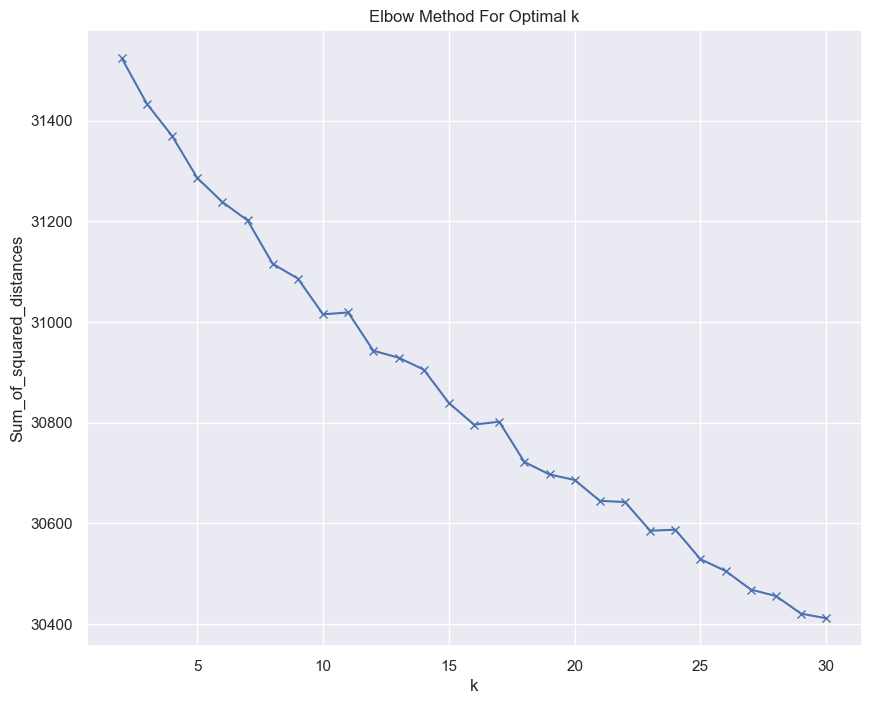

In [82]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
Sum_of_squared_distances = []
K = range(2,31)
for k in K:
   km = KMeans(n_clusters=k, max_iter=200, n_init=10)
   km = km.fit(X_tfidf)
   Sum_of_squared_distances.append(km.inertia_)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()


# Clustering Sparse Data with K-means & Evaluating Cluster Output

In [ ]:
#Explore with random initialization of 1 # K-Means with Eucledean distance
#from sklearn.cluster import KMeans

#for seed in range(10):
    #kmeans = KMeans(
        #n_clusters=true_k,
        #max_iter=100,
        #n_init=1,
        #random_state=seed,
    #).fit(X_tfidf)
    #cluster_ids, cluster_sizes = np.unique(kmeans.labels_, return_counts=True)
    #print(f"Number of elements asigned to each cluster: {cluster_sizes}")
#print()
#print(
    #"True number of documents in each category according to the class labels: "
    #f"{category_sizes}"
#)

In [83]:
### K-Means with Cosine similarity
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity, pairwise_distances

for seed in range(3):
    kmeans = KMeans(
        n_clusters=true_k,
        max_iter=100,
        n_init=1,
        random_state=seed
    )
    # Precompute pairwise cosine similarities
    pairwise_sims = cosine_similarity(X_tfidf)
    # Compute pairwise distances using cosine similarity
    pairwise_dists = 1 - pairwise_sims
    # Initialize cluster centers randomly
    random_indices = np.random.choice(X_tfidf.shape[0], true_k, replace=False)
    kmeans.cluster_centers_ = X_tfidf[random_indices]
    # Assign cluster labels based on cosine similarity to centers
    distances_to_centers = pairwise_distances(X_tfidf, kmeans.cluster_centers_, metric="cosine")
    kmeans.labels_ = distances_to_centers.argmin(axis=1)
    cluster_ids, cluster_sizes = np.unique(kmeans.labels_, return_counts=True)
    print(f"Number of elements assigned to each cluster: {cluster_sizes}")
print()
print(
    "True number of documents in each category according to the class labels: "
    f"{category_sizes}"
)


Number of elements assigned to each cluster: [24761  5318  1917]
Number of elements assigned to each cluster: [23535  4291  4170]
Number of elements assigned to each cluster: [21063  1568  9365]

True number of documents in each category according to the class labels: [ 8012 15901  8083]


In [ ]:
#from sklearn.cluster import KMeans
#from sklearn.random_projection import SparseRandomProjection
#from sklearn.metrics.pairwise import cosine_similarity

# Reduce dimensionality using randomized projections
#random_proj = SparseRandomProjection(n_components=500, random_state=42)
#X_rp = random_proj.fit_transform(X_tfidf)

#for seed in range(3):
    # Compute pairwise distances using randomized projections
    #pairwise_dists = 1 - cosine_similarity(X_rp)

    # Cluster documents using KMeans
    #kmeans = KMeans(
       # n_clusters=true_k,
        #max_iter=100,
        #n_init=1,
        #random_state=seed,
    #).fit(pairwise_dists)

    #cluster_ids, cluster_sizes = np.unique(kmeans.labels_, return_counts=True)
    #print(f"Number of elements assigned to each cluster: {cluster_sizes}")

#print("True number of documents in each category according to the class labels:", category_sizes)

In [85]:
fit_and_evaluate(kmeans, X_tfidf, name="KMeans\non tf-idf vectors")

clustering done in 0.30 ± 0.01 s 
Homogeneity: 0.021 ± 0.003
Completeness: 0.028 ± 0.004
V-measure: 0.024 ± 0.003
Adjusted Rand-Index: 0.056 ± 0.007
Silhouette Coefficient: 0.003 ± 0.000


In [86]:
#Explore with random initialization of 30
kmeans = KMeans(
    n_clusters=true_k,
    max_iter=100,
    n_init=30,
)

fit_and_evaluate(kmeans, X_tfidf, name="KMeans\non tf-idf vectors")

clustering done in 8.68 ± 0.12 s 
Homogeneity: 0.010 ± 0.007
Completeness: 0.034 ± 0.018
V-measure: 0.016 ± 0.010
Adjusted Rand-Index: 0.013 ± 0.013
Silhouette Coefficient: 0.003 ± 0.000


In [87]:
#Explore with random initialization of 50
kmeans = KMeans(
    n_clusters=true_k,
    max_iter=100,
    n_init=50,
)

fit_and_evaluate(kmeans, X_tfidf, name="KMeans\non tf-idf vectors")

clustering done in 15.70 ± 0.32 s 
Homogeneity: 0.007 ± 0.000
Completeness: 0.025 ± 0.000
V-measure: 0.011 ± 0.000
Adjusted Rand-Index: 0.007 ± 0.000
Silhouette Coefficient: 0.004 ± 0.001


# Apply Performing Dimensionality Reduction using Latent Semantic Analysis (LSA) on Sparse Data

In [88]:
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer

lsa = make_pipeline(TruncatedSVD(n_components=100), Normalizer(copy=False))
t0 = time()
X_lsa = lsa.fit_transform(X_tfidf)
explained_variance = lsa[0].explained_variance_ratio_.sum()

print(f"LSA done in {time() - t0:.3f} s")
print(f"Explained variance of the SVD step: {explained_variance * 100:.1f}%")

LSA done in 1.866 s
Explained variance of the SVD step: 13.9%


# Clustering Data in Reduced Dimesionality Space with K-means & Evaluating Cluster Output

In [89]:
kmeans = KMeans(
    n_clusters=true_k,
    max_iter=100,
    n_init=1,
)

fit_and_evaluate(kmeans, X_lsa, name="KMeans\nwith LSA on tf-idf vectors")

clustering done in 0.15 ± 0.02 s 
Homogeneity: 0.030 ± 0.007
Completeness: 0.034 ± 0.008
V-measure: 0.032 ± 0.007
Adjusted Rand-Index: 0.048 ± 0.013
Silhouette Coefficient: 0.022 ± 0.001


# Clustering Data in Reduced Dimesionality Space with Improved K-means (MiniBatchKmeans) & Evaluating Cluster Output

In [90]:
#MiniBatchKmeans is suitable for large datasets
from sklearn.cluster import MiniBatchKMeans

minibatch_kmeans = MiniBatchKMeans(
    n_clusters=true_k,
    n_init=1,
    init_size=1000,
    batch_size=1000,
)

fit_and_evaluate(
    minibatch_kmeans,
    X_lsa,
    name="MiniBatchKMeans\nwith LSA on tf-idf vectors",
)

C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\User

clustering done in 0.52 ± 0.05 s 
Homogeneity: 0.012 ± 0.001
Completeness: 0.013 ± 0.001
V-measure: 0.013 ± 0.001
Adjusted Rand-Index: 0.014 ± 0.012
Silhouette Coefficient: 0.018 ± 0.002


# Check Cluster Assignments: List Top Words Per Cluster

In [91]:
original_space_centroids = lsa[0].inverse_transform(kmeans.cluster_centers_)
order_centroids = original_space_centroids.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()

for i in range(true_k):
    print(f"Cluster {i}: ", end="")
    for ind in order_centroids[i, :10]:
        print(f"{terms[ind]} ", end="")
    print()

Cluster 0: new health future healthcare technology covid great digital business global 
Cluster 1: markets economy bloomberg investing stocks bonds fed investors covid centralbanks 
Cluster 2: people time work like just make life think day know 


# Generate a HashingVectorizer (IDF-Weighting Not Applied)

In [92]:
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

lsa_vectorizer = make_pipeline(
    HashingVectorizer(stop_words="english", n_features=50_000),
    TfidfTransformer(),
    TruncatedSVD(n_components=100, random_state=0),
    Normalizer(copy=False),
)

t0 = time()
X_hashed_lsa = lsa_vectorizer.fit_transform(df.content)
print(f"vectorization done in {time() - t0:.3f} s")

vectorization done in 4.354 s


# Clustering Reduced Dimensionality Data for HashedVector with K-means & MiniBatchKmeans & Evaluating Cluster Output

In [93]:
fit_and_evaluate(kmeans, X_hashed_lsa, name="KMeans\nwith LSA on hashed vectors")

clustering done in 0.17 ± 0.02 s 
Homogeneity: 0.021 ± 0.006
Completeness: 0.034 ± 0.011
V-measure: 0.025 ± 0.007
Adjusted Rand-Index: 0.042 ± 0.013
Silhouette Coefficient: 0.021 ± 0.005


In [94]:
fit_and_evaluate(
    minibatch_kmeans,
    X_hashed_lsa,
    name="MiniBatchKMeans\nwith LSA on hashed vectors",
)

C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\User

clustering done in 0.47 ± 0.05 s 
Homogeneity: 0.015 ± 0.005
Completeness: 0.015 ± 0.006
V-measure: 0.015 ± 0.006
Adjusted Rand-Index: 0.015 ± 0.004
Silhouette Coefficient: 0.017 ± 0.003


# Visualize Summary of Clustering Results based on type of Reaction ¶

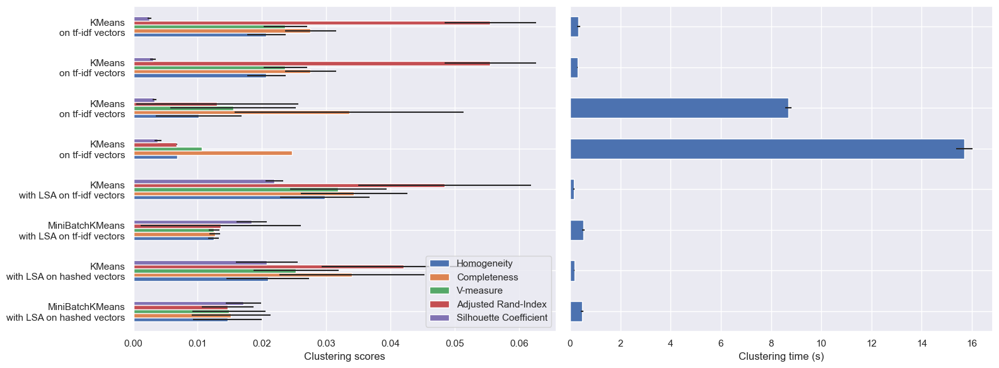

In [95]:
import pandas as pd
import matplotlib.pyplot as plt

fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(16, 6), sharey=True)

df_reactions = pd.DataFrame(evaluations[::-1]).set_index("estimator")
df_std = pd.DataFrame(evaluations_std[::-1]).set_index("estimator")

df_reactions.drop(
    ["train_time"],
    axis="columns",
).plot.barh(ax=ax0, xerr=df_std)
ax0.set_xlabel("Clustering scores")
ax0.set_ylabel("")

df_reactions["train_time"].plot.barh(ax=ax1, xerr=df_std["train_time"])
ax1.set_xlabel("Clustering time (s)")
plt.tight_layout()

# Feature generation using comments label

In [96]:
categories = [
    "low",
    "medium",
    "high",
]

labels = df.comment_class
unique_labels, category_sizes = np.unique(labels, return_counts=True)
true_k = unique_labels.shape[0]

print(f"{len(df.preprocess_txt)} documents - {true_k} categories")

31996 documents - 3 categories


In [ ]:
#categories = [
    #"class_1",
    #"class_2",
    #"class_3",
    #"class_4",
    #"class_5",
    #"class_6",
    #"class_7",
    #"class_8",
    #"class_9",
    #"class_10",
#]

#labels = df.comment_class
#unique_labels, category_sizes = np.unique(labels, return_counts=True)
#true_k = unique_labels.shape[0]

#print(f"{len(df.preprocess_txt)} documents - {true_k} categories")

In [97]:
# Display the size of each class
for i, category in enumerate(categories):
    print(f"{category}: {category_sizes[i]} contents")

low: 8224 contents
medium: 15907 contents
high: 7865 contents


In [98]:
# Map each comment to its corresponding class
for index, row in df.iterrows():
    comment = row['content']
    comment_class = row['comment_class']
    print(f"content: {comment}\tClass: {comment_class}")

content: robert lerman  writes that achieving a healthy future of work requires employees to build skills that help them attain productive and rewarding careers he notes  one of the most costeffective ways to do this is through apprenticeship which helps workers master occupations and gain professional identity and pride coudlnt agree more  workbasedlearning   usa   apprenticeship   read the article on  urbanwire   urban institute 
 
 
 	Class: low
content: national disability advocate  sara hart weir ms   shares how congress passed the able act	Class: low
content: exploring in this months talent management  hr what a company should consider to get the most out of a modern apprenticeship program thanks to employer  entrepreneuer  ankur gopal  for sharing insights on your it program  why not start a program in  wishing you all a safe and happy festive season  nick  careerplanning   apprenticeships   workbasedlearning   careers   urban institute   zach boren   robert lerman   lana gordon

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [99]:
# Group influencers by content and reaction_class
grouped_df = df.groupby(['content', 'reaction_class']).size().reset_index(name='count')

# Print the grouped dataframe
print(grouped_df.head())

                                             content reaction_class  count
0                                                              high      2
1                                                               low     10
2                                                            medium      5
3        good way to learn how  navigate forward ...            low      1
4       radicalcpa   cpafirm   taxseason   accoun...            low      1


In [100]:
df = df.loc[df['content'].notnull()]

In [102]:
# Check if there are any remaining empty rows for 'content'
empty_rows = df[df['content'].isnull()]
if empty_rows.empty:
    print("No empty rows for 'content' column.")
else:
    print("There are empty rows for 'content' column.")

No empty rows for 'content' column.


In [103]:
from collections import defaultdict
from sklearn import metrics
from time import time

evaluations = []
evaluations_std = []


def fit_and_evaluate(km, X, name=None, n_runs=5):
    name = km.__class__.__name__ if name is None else name

    train_times = []
    scores = defaultdict(list)
    for seed in range(n_runs):
        km.set_params(random_state=seed)
        t0 = time()
        km.fit(X)
        train_times.append(time() - t0)
        scores["Homogeneity"].append(metrics.homogeneity_score(labels, km.labels_))
        scores["Completeness"].append(metrics.completeness_score(labels, km.labels_))
        scores["V-measure"].append(metrics.v_measure_score(labels, km.labels_))
        scores["Adjusted Rand-Index"].append(
            metrics.adjusted_rand_score(labels, km.labels_)
        )
        scores["Silhouette Coefficient"].append(
            metrics.silhouette_score(X, km.labels_, sample_size=2000)
        )
    train_times = np.asarray(train_times)

    print(f"clustering done in {train_times.mean():.2f} ± {train_times.std():.2f} s ")
    evaluation = {
        "estimator": name,
        "train_time": train_times.mean(),
    }
    evaluation_std = {
        "estimator": name,
        "train_time": train_times.std(),
    }
    for score_name, score_values in scores.items():
        mean_score, std_score = np.mean(score_values), np.std(score_values)
        print(f"{score_name}: {mean_score:.3f} ± {std_score:.3f}")
        evaluation[score_name] = mean_score
        evaluation_std[score_name] = std_score
    evaluations.append(evaluation)
    evaluations_std.append(evaluation_std)

In [104]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(
    max_df=0.5,
    min_df=5,
    stop_words="english",
)
t0 = time()
X_tfidf = vectorizer.fit_transform(df['content'])

print(f"vectorization done in {time() - t0:.3f} s")
print(f"n_samples: {X_tfidf.shape[0]}, n_features: {X_tfidf.shape[1]}")

vectorization done in 1.273 s
n_samples: 31996, n_features: 13579


In [105]:
print(f"{X_tfidf.nnz / np.prod(X_tfidf.shape):.3f}")

0.002


In [ ]:
#Explore with random initialization of 1 # K-Means with Eucledean distance
#from sklearn.cluster import KMeans

#for seed in range(3):
    #kmeans = KMeans(
        #n_clusters=true_k,
        #max_iter=100,
        #n_init=1,
        #random_state=seed,
    #).fit(X_tfidf)
    #cluster_ids, cluster_sizes = np.unique(kmeans.labels_, return_counts=True)
    #print(f"Number of elements asigned to each cluster: {cluster_sizes}")
#print()
#print(
    #"True number of documents in each category according to the class labels: "
    #f"{category_sizes}"
#)

In [106]:
# K-Means with Cosine similarity
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity, pairwise_distances

for seed in range(3):
    kmeans = KMeans(
        n_clusters=true_k,
        max_iter=100,
        n_init=1,
        random_state=seed
    )
    # Precompute pairwise cosine similarities
    pairwise_sims = cosine_similarity(X_tfidf)
    # Compute pairwise distances using cosine similarity
    pairwise_dists = 1 - pairwise_sims
    # Initialize cluster centers randomly
    random_indices = np.random.choice(X_tfidf.shape[0], true_k, replace=False)
    kmeans.cluster_centers_ = X_tfidf[random_indices]
    # Assign cluster labels based on cosine similarity to centers
    distances_to_centers = pairwise_distances(X_tfidf, kmeans.cluster_centers_, metric="cosine")
    kmeans.labels_ = distances_to_centers.argmin(axis=1)
    cluster_ids, cluster_sizes = np.unique(kmeans.labels_, return_counts=True)
    print(f"Number of elements assigned to each cluster: {cluster_sizes}")
print()
print(
    "True number of documents in each category according to the class labels: "
    f"{category_sizes}"
)

Number of elements assigned to each cluster: [26426  4272  1298]
Number of elements assigned to each cluster: [24342  4232  3422]
Number of elements assigned to each cluster: [21823  7453  2720]

True number of documents in each category according to the class labels: [ 8224 15907  7865]


In [107]:
fit_and_evaluate(kmeans, X_tfidf, name="KMeans\non tf-idf vectors")

clustering done in 0.37 ± 0.07 s 
Homogeneity: 0.025 ± 0.002
Completeness: 0.033 ± 0.003
V-measure: 0.028 ± 0.002
Adjusted Rand-Index: 0.056 ± 0.005
Silhouette Coefficient: 0.003 ± 0.000


In [108]:
#Explore with random initialization of 30
kmeans = KMeans(
    n_clusters=true_k,
    max_iter=100,
    n_init=30,
)

fit_and_evaluate(kmeans, X_tfidf, name="KMeans\non tf-idf vectors")

clustering done in 9.25 ± 0.10 s 
Homogeneity: 0.008 ± 0.004
Completeness: 0.026 ± 0.011
V-measure: 0.012 ± 0.006
Adjusted Rand-Index: 0.010 ± 0.011
Silhouette Coefficient: 0.003 ± 0.000


In [109]:
#Explore with random initialization of 30
kmeans = KMeans(
    n_clusters=true_k,
    max_iter=100,
    n_init=50,
)

fit_and_evaluate(kmeans, X_tfidf, name="KMeans\non tf-idf vectors")

clustering done in 15.71 ± 0.12 s 
Homogeneity: 0.006 ± 0.000
Completeness: 0.020 ± 0.000
V-measure: 0.009 ± 0.000
Adjusted Rand-Index: 0.004 ± 0.000
Silhouette Coefficient: 0.004 ± 0.001


# Apply Performing Dimensionality Reduction using Latent Semantic Analysis (LSA) on Sparse Data

In [110]:
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer


lsa = make_pipeline(TruncatedSVD(n_components=100), Normalizer(copy=False))
t0 = time()
X_lsa = lsa.fit_transform(X_tfidf)
explained_variance = lsa[0].explained_variance_ratio_.sum()

print(f"LSA done in {time() - t0:.3f} s")
print(f"Explained variance of the SVD step: {explained_variance * 100:.1f}%")

LSA done in 1.735 s
Explained variance of the SVD step: 13.9%


# Clustering Data in Reduced Dimesionality Space with K-means & Evaluating Cluster Output

In [111]:
kmeans = KMeans(
    n_clusters=true_k,
    max_iter=100,
    n_init=1,
)

fit_and_evaluate(kmeans, X_lsa, name="KMeans\nwith LSA on tf-idf vectors")

clustering done in 0.15 ± 0.01 s 
Homogeneity: 0.022 ± 0.010
Completeness: 0.030 ± 0.013
V-measure: 0.025 ± 0.010
Adjusted Rand-Index: 0.037 ± 0.024
Silhouette Coefficient: 0.022 ± 0.003


# Clustering Data in Reduced Dimesionality Space with Improved K-means (MiniBatchKmeans) & Evaluating Cluster Output

In [112]:
#MiniBatchKmeans is suitable for large datasets
from sklearn.cluster import MiniBatchKMeans

minibatch_kmeans = MiniBatchKMeans(
    n_clusters=true_k,
    n_init=1,
    init_size=1000,
    batch_size=1000,
)

fit_and_evaluate(
    minibatch_kmeans,
    X_lsa,
    name="MiniBatchKMeans\nwith LSA on tf-idf vectors",
)

C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\User

clustering done in 0.50 ± 0.08 s 
Homogeneity: 0.016 ± 0.004
Completeness: 0.017 ± 0.005
V-measure: 0.016 ± 0.005
Adjusted Rand-Index: 0.016 ± 0.010
Silhouette Coefficient: 0.018 ± 0.003


# Check Cluster Assignments: List Top Words Per Cluster

In [113]:
original_space_centroids = lsa[0].inverse_transform(kmeans.cluster_centers_)
order_centroids = original_space_centroids.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()

for i in range(true_k):
    print(f"Cluster {i}: ", end="")
    for ind in order_centroids[i, :10]:
        print(f"{terms[ind]} ", end="")
    print()

Cluster 0: new great business world marketing today startup media global read 
Cluster 1: people time work like just make life think need know 
Cluster 2: healthcare health markets economy covid future digitalhealth medicine technology digital 


# Generate a HashingVectorizer (IDF-Weighting Not Applied)

In [114]:
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

lsa_vectorizer = make_pipeline(
    HashingVectorizer(stop_words="english", n_features=50_000),
    TfidfTransformer(),
    TruncatedSVD(n_components=100, random_state=0),
    Normalizer(copy=False),
)

t0 = time()
X_hashed_lsa = lsa_vectorizer.fit_transform(df.content)
print(f"vectorization done in {time() - t0:.3f} s")

vectorization done in 4.256 s


# Clustering Reduced Dimensionality Data for HashedVector with K-means & MiniBatchKmeans & Evaluating Cluster Output

In [115]:
fit_and_evaluate(kmeans, X_hashed_lsa, name="KMeans\nwith LSA on hashed vectors")

clustering done in 0.17 ± 0.03 s 
Homogeneity: 0.020 ± 0.007
Completeness: 0.031 ± 0.007
V-measure: 0.024 ± 0.006
Adjusted Rand-Index: 0.039 ± 0.011
Silhouette Coefficient: 0.021 ± 0.003


In [116]:
fit_and_evaluate(
    minibatch_kmeans,
    X_hashed_lsa,
    name="MiniBatchKMeans\nwith LSA on hashed vectors",
)

C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\Users\rhoda\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1902: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(
C:\User

clustering done in 0.48 ± 0.05 s 
Homogeneity: 0.016 ± 0.004
Completeness: 0.017 ± 0.005
V-measure: 0.016 ± 0.005
Adjusted Rand-Index: 0.015 ± 0.004
Silhouette Coefficient: 0.018 ± 0.003


# Visualize Summary of Clustering Results

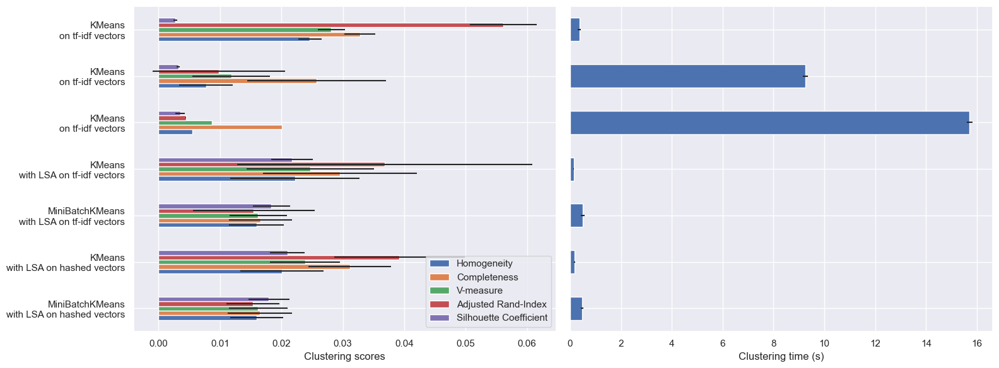

In [117]:
import pandas as pd
import matplotlib.pyplot as plt

fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(16, 6), sharey=True)

df_comments = pd.DataFrame(evaluations[::-1]).set_index("estimator")
df_std = pd.DataFrame(evaluations_std[::-1]).set_index("estimator")

df_comments.drop(
    ["train_time"],
    axis="columns",
).plot.barh(ax=ax0, xerr=df_std)
ax0.set_xlabel("Clustering scores")
ax0.set_ylabel("")

df_comments["train_time"].plot.barh(ax=ax1, xerr=df_std["train_time"])
ax1.set_xlabel("Clustering time (s)")
plt.tight_layout()

In [118]:
sid = SentimentIntensityAnalyzer()
ps = lambda x : sid.polarity_scores(x)
sentiment_scores = df.preprocess_txt.apply(ps)
sentiment_scores

0        {'neg': 0.0, 'neu': 0.618, 'pos': 0.382, 'comp...
1        {'neg': 0.0, 'neu': 0.82, 'pos': 0.18, 'compou...
2        {'neg': 0.0, 'neu': 0.649, 'pos': 0.351, 'comp...
3        {'neg': 0.0, 'neu': 0.732, 'pos': 0.268, 'comp...
4        {'neg': 0.0, 'neu': 0.925, 'pos': 0.075, 'comp...
                               ...                        
31991    {'neg': 0.0, 'neu': 0.493, 'pos': 0.507, 'comp...
31992    {'neg': 0.0, 'neu': 0.479, 'pos': 0.521, 'comp...
31993    {'neg': 0.0, 'neu': 0.622, 'pos': 0.378, 'comp...
31994    {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...
31995    {'neg': 0.203, 'neu': 0.797, 'pos': 0.0, 'comp...
Name: preprocess_txt, Length: 31996, dtype: object

In [119]:
sentiment_df = pd.DataFrame(data = list(sentiment_scores))
sentiment_df.head()

,neg,neu,pos,compound
0,0.0,0.618,0.382,0.9571
1,0.0,0.820,0.180,0.2960
2,0.0,0.649,0.351,0.9584
3,0.0,0.732,0.268,0.9685
4,0.0,0.925,0.075,0.2960


In [120]:
#label scores based on polarity
labelize = lambda x : 'neutral' if x==0 else('positive' if x>0 else 'negative')
sentiment_df['label'] = sentiment_df.compound.apply(labelize)
sentiment_df.head()

,neg,neu,pos,compound,label
0,0.0,0.618,0.382,0.9571,positive
1,0.0,0.820,0.180,0.2960,positive
2,0.0,0.649,0.351,0.9584,positive
3,0.0,0.732,0.268,0.9685,positive
4,0.0,0.925,0.075,0.2960,positive


In [121]:
data = df.join(sentiment_df.label)
data.head()

,influencer,headline,about,Sector,Position,time_spent,content,content_links,media_url,num_hashtags,...,reaction_class,comment_class,hashtag_binary,word_count,preprocess_txt,clean_content,comments_label,reaction_label,clean_about_txt,label
0,Nicholas Wyman,CEO IWSI Group,nicholas wyman for the past years has shone a...,Education,"Advisory, Entreprenuer, Advocacy, Author",1 day ago,robert lerman writes that achieving a healthy...,[['https://www.linkedin.com/in/ACoAAACy1HkBviR...,['https://www.urban.org/urban-wire/its-time-mo...,4,...,low,low,1,61,robert lerman writes achieving healthy future ...,39,medium,medium,nicholas wyman past year shone light mismatch ...,positive
1,Nicholas Wyman,CEO IWSI Group,nicholas wyman for the past years has shone a...,Education,"Advisory, Entreprenuer, Advocacy, Author",1 week ago,national disability advocate sara hart weir m...,[['https://www.linkedin.com/in/ACoAAAHsfJgBb7_...,[],0,...,low,low,0,14,national disability advocate sara hart weir m ...,12,medium,medium,nicholas wyman past year shone light mismatch ...,positive
2,Nicholas Wyman,CEO IWSI Group,nicholas wyman for the past years has shone a...,Education,"Advisory, Entreprenuer, Advocacy, Author",2 months ago,exploring in this months talent management hr...,[['https://www.linkedin.com/in/ACoAAAADlGIBLfn...,['https://www.tlnt.com/apprenticeships-that-br...,4,...,medium,low,1,69,exploring month talent management hr company c...,45,medium,medium,nicholas wyman past year shone light mismatch ...,positive
3,Nicholas Wyman,CEO IWSI Group,nicholas wyman for the past years has shone a...,Education,"Advisory, Entreprenuer, Advocacy, Author",2 months ago,i count myself fortunate to have spent time wi...,[['https://www.linkedin.com/in/ACoAABhNxDUB9IX...,['https://gritdaily.com/the-legacy-of-verified...,3,...,low,low,1,109,count fortunate spent time brooklynborn arnold...,72,medium,medium,nicholas wyman past year shone light mismatch ...,positive
4,Nicholas Wyman,CEO IWSI Group,nicholas wyman for the past years has shone a...,Education,"Advisory, Entreprenuer, Advocacy, Author",2 months ago,online job platforms are a different way of wo...,[['https://www.linkedin.com/feed/hashtag/?keyw...,['https://www.forbes.com/sites/nicholaswyman/2...,5,...,low,low,1,45,online job platform different way working buil...,28,medium,medium,nicholas wyman past year shone light mismatch ...,positive


In [122]:
counts_df = data.label.value_counts().reset_index()
counts_df

,index,label
0,positive,22203
1,neutral,4978
2,negative,4815


<Axes: xlabel='index', ylabel='label'>

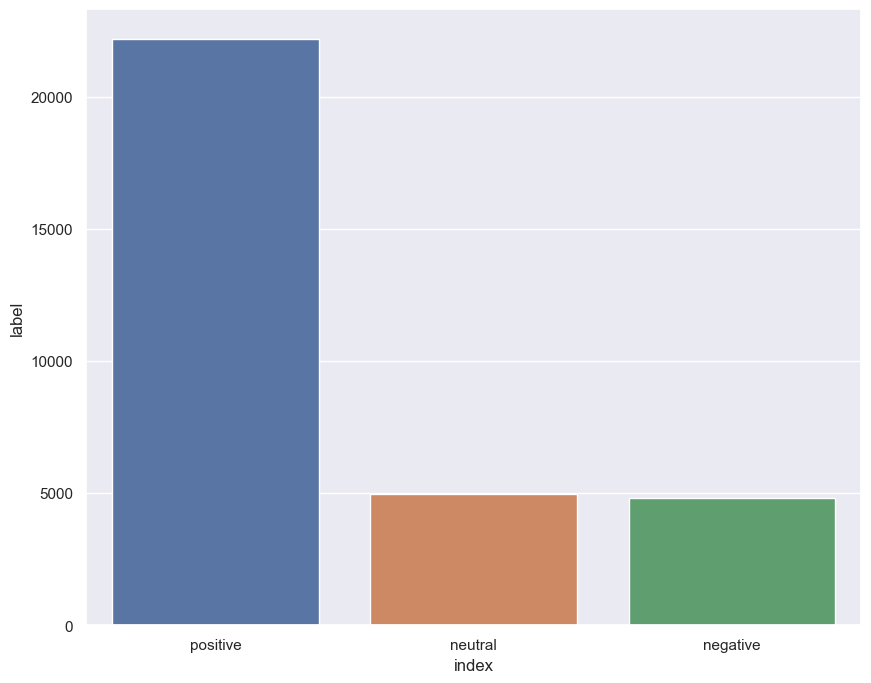

In [123]:
sns.barplot(data=counts_df, x='index', y='label')

In [129]:
def sent_to_words(sentences):
    stop_words = set(stopwords.words('english'))
    additional_stopwords = set(['feel', 'thing', 'day', 'go', 'help', 'join', 'together', 'instead', 'thank', 'always', 'next', 'message', 'content', 'ever', 'hear', 'hard', 'last', 'leave', 'small' 'first', 'ask', 'give', 'even', 'bad', 'less', 'little', 'rather', 'take', 'need', 'night', 'see', 'well',  'ask', 'many', 'take', 'good', 'use', 'week', 'come', 'tell', 'word'])
    stop_words = stop_words.union(additional_stopwords)
    
    for sent in sentences:
        sent = re.sub('\S*@\S*\s?', '', sent)  # remove emails
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub(r'https\S+', '', sent)  # remove_url
        sent = re.sub('[\d+]', '', sent)  # remove_numbers
        sent = re.sub("…see more", '', sent)  # remove_seemore
        sent = re.sub(r'[^\w\s]', '', sent)  # remove_punctuation
        sent = re.sub(r'[A-Z]', lambda x: x.group(0).lower(), sent)  # convert to lowercase
        sent = re.sub("'", "", sent)  # remove single quotes
        tokens = word_tokenize(sent)
        filtered_words = [word for word in tokens if word.lower() not in stop_words]
        sent = gensim.utils.simple_preprocess(" ".join(filtered_words), deacc=True)
        yield(sent)

# Convert to list
data = df.content.values.tolist()
data_words = list(sent_to_words(data))
print(data_words[:1])


<>:7: DeprecationWarning: invalid escape sequence '\S'
<>:8: DeprecationWarning: invalid escape sequence '\s'
<>:10: DeprecationWarning: invalid escape sequence '\d'
<>:7: DeprecationWarning: invalid escape sequence '\S'
<>:8: DeprecationWarning: invalid escape sequence '\s'
<>:10: DeprecationWarning: invalid escape sequence '\d'
C:\Users\rhoda\AppData\Local\Temp\ipykernel_25232\1355627778.py:7: DeprecationWarning: invalid escape sequence '\S'
  sent = re.sub('\S*@\S*\s?', '', sent)  # remove emails
C:\Users\rhoda\AppData\Local\Temp\ipykernel_25232\1355627778.py:8: DeprecationWarning: invalid escape sequence '\s'
  sent = re.sub('\s+', ' ', sent)  # remove newline chars
C:\Users\rhoda\AppData\Local\Temp\ipykernel_25232\1355627778.py:10: DeprecationWarning: invalid escape sequence '\d'
  sent = re.sub('[\d+]', '', sent)  # remove_numbers


[['robert', 'lerman', 'writes', 'achieving', 'healthy', 'future', 'work', 'requires', 'employees', 'build', 'skills', 'attain', 'productive', 'rewarding', 'careers', 'notes', 'one', 'costeffective', 'ways', 'apprenticeship', 'helps', 'workers', 'master', 'occupations', 'gain', 'professional', 'identity', 'pride', 'coudlnt', 'agree', 'usa', 'apprenticeship', 'read', 'article', 'urbanwire', 'urban', 'institute']]


In [130]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# !python3 -m spacy download en  # run in terminal once
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out

data_ready = process_words(data_words)

In [131]:
data_ready

[['robert_lerman',
  'write',
  'achieve',
  'healthy',
  'future',
  'work',
  'require',
  'employee',
  'build',
  'skill',
  'attain',
  'productive',
  'rewarding',
  'career',
  'note',
  'costeffective',
  'apprenticeship',
  'help',
  'worker',
  'master',
  'occupation',
  'gain',
  'professional',
  'identity',
  'pride',
  'coudlnt',
  'agree',
  'read',
  'article',
  'urbanwire',
  'urban',
  'institute'],
 ['national', 'disability', 'advocate', 'sara', 'pass', 'able', 'act'],
 ['explore',
  'month',
  'talent',
  'management',
  'company',
  'consider',
  'modern',
  'apprenticeship',
  'program',
  'gopal',
  'sharing',
  'insight',
  'program',
  'start',
  'program',
  'wish',
  'safe',
  'happy',
  'nick',
  'careerplanning',
  'apprenticeship',
  'career',
  'institute',
  'zach',
  'ervin'],
 ['count',
  'fortunate',
  'spend',
  'policy',
  'evaluation',
  'research',
  'insight',
  'innovative',
  'think',
  'economic',
  'employment',
  'training',
  'policy',
  

In [132]:
# Create Dictionary
id2word = corpora.Dictionary(data_ready)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_ready]

# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=10,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)

pprint(lda_model.print_topics())

[(0,
  '0.076*"live" + 0.053*"change" + 0.053*"find" + 0.036*"inspire" + '
  '0.033*"today" + 0.033*"growth" + 0.030*"opportunity" + 0.024*"serve" + '
  '0.023*"come" + 0.019*"creativity"'),
 (1,
  '0.042*"video" + 0.040*"story" + 0.036*"create" + 0.034*"podcast" + '
  '0.031*"value" + 0.028*"action" + 0.027*"idea" + 0.025*"power" + 0.022*"ask" '
  '+ 0.022*"comment"'),
 (2,
  '0.068*"success" + 0.065*"listen" + 0.035*"progress" + 0.028*"word" + '
  '0.025*"become" + 0.025*"believe" + 0.023*"check" + 0.022*"awareness" + '
  '0.022*"feel" + 0.019*"allow"'),
 (3,
  '0.071*"leadership" + 0.049*"share" + 0.039*"time" + 0.025*"thing" + '
  '0.024*"think" + 0.024*"work" + 0.017*"communication" + 0.016*"mindset" + '
  '0.015*"go" + 0.015*"build"'),
 (4,
  '0.000*"revel" + 0.000*"theinfinitegame" + 0.000*"optimismpress" + '
  '0.000*"discuss_chapter" + 0.000*"infinite_game" + 0.000*"unwilling" + '
  '0.000*"startwithwhy" + 0.000*"newyorkcity" + 0.000*"irony" + '
  '0.000*"friday_july"'),
 (5,


In [134]:
import pyLDAvis
from pyLDAvis import gensim_models
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary=lda_model.id2word)
pyLDAvis.display(vis)
vis

C:\Users\rhoda\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:244: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)


TypeError: Object of type complex is not JSON serializable

In [ ]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)